In [1]:
import tensorflow as tf


selected_device = 1
physical_devices = tf.config.list_physical_devices('GPU')
print("GPUs available:", physical_devices)
tf.config.set_visible_devices(physical_devices[selected_device], 'GPU')
print("GPU selected:", physical_devices[selected_device])


GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
GPU selected: PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')


In [2]:
import math
import numpy as np


from ocml.datasets import load_toy_2d, default_process, build_dataset
from ocml.evaluate import check_LLC
from ocml.models import conventional_dense, spectral_dense
from ocml.plot import plot_2D_contour
from ocml.priors import uniform_sampler_tabular
from ocml.train import train_loop, SH_KR, BCE

In [3]:
from types import SimpleNamespace

def get_config(debug=False):
  config = SimpleNamespace(
    num_pts = 4000,
    dataset_name = "two-moons",
    optimizer = 'rmsprop',  # optimizer; good default value.
    batch_size = 256,  # should be not too small to ensure diversity.
    domain = [-5., 5.],  # domain on which to sample points.
    maxiter = 4,  # very important on high dimensional dataset.
    margin = 0.05,  # very important !
    lbda = 100.,  # important but not as much as `margin`. Must be high for best results.
    k_coef_lip = 1.,  # no reason to change this.
    noise = 0.05,  # to introduce noise in dataset (for better plots)
    num_epochs = 50 if not debug else 1,
    spectral_dense = True,  # Mandatory for orthogonal networks. 
    pgd = False,  # Does not work well.
    deterministic = False,  # Better with random learning rates.
    domain_clip = False,  # To ensure it remains in the domain. Not so important.
    boundary = True,  # Whether to stop at the boundary or at the margin (not very different).
    conventional = False,  # Conventional training (i.e without hKR and Lipschitz constraint) for sanity check.
    widths = [512, 512, 512, 512]
  )
  return config

In [4]:
debug = False
config = get_config(debug)

In [5]:
try:
  import os
  os.environ['WANDB_NOTEBOOK_NAME'] = 'run_toy2d.ipynb'
  import wandb
  wandb.login()
  wandb_available = True
except ModuleNotFoundError as e:
  print(e)
  print("Wandb logs will be removed.")
  wandb_available = False
plot_wandb = wandb_available and not debug  # Set to False to de-activate Wandb.
if plot_wandb:  
  import wandb
  wandb.init(project="oneclass", config=config.__dict__)
else:
  try:
    wandb.finish()
  except Exception as e:
    print(e)

wandb: Currently logged in as: algue (use `wandb login --relogin` to force relogin)


In [6]:
# Train model.
if config.conventional:
  model = conventional_dense(widths=config.widths, input_shape=(2,))
else:
  model = spectral_dense(widths=config.widths, input_shape=(2,),
                         k_coef_lip=config.k_coef_lip)

if config.conventional:
  loss_fn = BCE()
else:
  loss_fn = SH_KR(config.margin, config.lbda)

In [7]:
# Produce and process dataset.
X, y = load_toy_2d(config.dataset_name, config.num_pts, config.noise)
X, y = default_process(X, y)
epoch_length = math.ceil(len(X) / config.batch_size) * config.num_epochs
dataset = build_dataset(X, config.batch_size)

# Create optimizer class.
opt =  tf.keras.optimizers.get(config.optimizer)

In [8]:
# Initialize the network.    
gen = tf.random.Generator.from_seed(4321)  # reproducible sampling.
_ = model(next(iter(dataset)), training=True)  # dummy forward to trigger initialization.
seeds = uniform_sampler_tabular(gen, config.batch_size, X.shape[1:], config.domain)
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spectral_dense (SpectralDens (None, 512)               3073      
_________________________________________________________________
full_sort (FullSort)         (None, 512)               0         
_________________________________________________________________
spectral_dense_1 (SpectralDe (None, 512)               525313    
_________________________________________________________________
full_sort_1 (FullSort)       (None, 512)               0         
_________________________________________________________________
spectral_dense_2 (SpectralDe (None, 512)               525313    
_________________________________________________________________
full_sort_2 (FullSort)       (None, 512)               0         
_________________________________________________________________
spectral_dense_3 (SpectralDe (None, 512)               5

Example n°156 from train set has norm 0.1412046104669571.
max_i \|nabla_x f(x_i)\|: tf.Tensor([[0.14120463]], shape=(1, 1), dtype=float32)
LLC = Local Lipschitz Constant
Input, LLC wrt Input, LLC wrt previous layer
Input_Norms 0.0014120037968104358 0.0014120037968104358
0 <class 'deel.lip.layers.SpectralDense'> 1.00 1.00
1 <class 'deel.lip.activations.FullSort'> 0.97 0.97
2 <class 'deel.lip.layers.SpectralDense'> 0.97 1.00
3 <class 'deel.lip.activations.FullSort'> 0.96 0.98
4 <class 'deel.lip.layers.SpectralDense'> 0.96 1.00
5 <class 'deel.lip.activations.FullSort'> 0.94 0.98
6 <class 'deel.lip.layers.SpectralDense'> 0.94 1.00
7 <class 'deel.lip.activations.FullSort'> 0.91 0.98
8 <class 'deel.lip.layers.FrobeniusDense'> 0.08 0.09
Output_Norms 0.00011947937261829206 0.00011947937261829206
0.0051597618 0.14120461


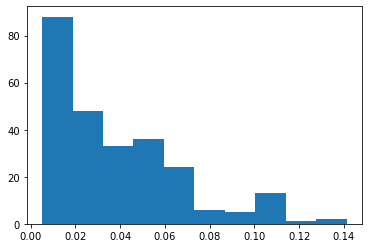

In [9]:
check_LLC(model, seeds, plot_wandb)

In [10]:
plot_2D_contour(model, loss_fn, X, config.domain, height=0.07, plot_wandb=plot_wandb)

In [12]:
train_loop(model, opt, loss_fn, gen, dataset, epoch_length, config.domain, config.maxiter, plot_wandb=plot_wandb)
plot_2D_contour(model, loss_fn, X, config.domain, height=0.07, plot_wandb=plot_wandb)

100%|██████████| 16/16 [00:03<00:00,  4.14it/s, false_positive=0.00%, grad_norm=0.0568, loss=0.0838, recall=1.00%]
